<a href="https://colab.research.google.com/github/N3M3515069/photonic-crystal-gan/blob/main/Vanilla_GAN_Photonic_Crystal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!rm -rf logs

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torch.utils.tensorboard import SummaryWriter
from PIL import Image
from google.colab import drive

In [3]:
# ─── Config ───
device     = "cuda" if torch.cuda.is_available() else "cpu"
LR         = 2e-4
Z_DIM      = 100
IMG_SIZE   = 64
IMG_DIM    = 3 * IMG_SIZE * IMG_SIZE   # 12288
BATCH_SIZE = 22
EPOCHS     = 1000

In [4]:
# ─── Dataset ───
class PhotonicDataset(Dataset):
    def __init__(self, folder_path, transform=None):
        self.transform   = transform
        self.image_paths = [
            os.path.join(folder_path, f)
            for f in os.listdir(folder_path)
            if f.lower().endswith(".jpg")
        ]

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx])
        if self.transform:
            image = self.transform(image)
        return image


drive.mount("/content/drive")

transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

dataset    = PhotonicDataset("/content/drive/MyDrive/GAN Project/GAN_images", transform=transform)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

print(f"Dataset size: {len(dataset)}")
print(f"Batch shape:  {next(iter(dataloader)).shape}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dataset size: 22
Batch shape:  torch.Size([22, 3, 64, 64])


In [5]:
# ─── Models ───
class Discriminator(nn.Module):
    def __init__(self, img_dim):
        super().__init__()
        self.disc = nn.Sequential(
            nn.Linear(img_dim, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.disc(x)


class Generator(nn.Module):
    def __init__(self, z_dim, img_dim):
        super().__init__()
        self.gen = nn.Sequential(
            nn.Linear(z_dim, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, img_dim),
            nn.Tanh(),
        )

    def forward(self, x):
        return self.gen(x)


disc = Discriminator(IMG_DIM).to(device)
gen  = Generator(Z_DIM, IMG_DIM).to(device)

In [6]:
# ─── Training Setup ───
opt_disc     = optim.Adam(disc.parameters(), lr=LR)
opt_gen      = optim.Adam(gen.parameters(),  lr=LR)
criterion    = nn.BCELoss()
fixed_noise  = torch.randn(BATCH_SIZE, Z_DIM).to(device)
writer_fake  = SummaryWriter("logs/fake")
writer_real  = SummaryWriter("logs/real")
step         = 0

In [7]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [8]:
# ─── Training Loop ───
for epoch in range(EPOCHS):
    for real in dataloader:
        real       = real.view(-1, IMG_DIM).to(device)
        batch_size = real.shape[0]

        # Train Discriminator: max log(D(x)) + log(1 - D(G(z)))
        noise        = torch.randn(batch_size, Z_DIM).to(device)
        fake         = gen(noise)

        disc_real    = disc(real).view(-1)
        loss_D_real  = criterion(disc_real, torch.ones_like(disc_real))
        disc_fake    = disc(fake.detach()).view(-1)
        loss_D_fake  = criterion(disc_fake, torch.zeros_like(disc_fake))
        loss_D       = (loss_D_real + loss_D_fake) / 2

        opt_disc.zero_grad()
        loss_D.backward()
        opt_disc.step()

        # Train Generator: max log(D(G(z)))
        output  = disc(fake).view(-1)
        loss_G  = criterion(output, torch.ones_like(output))

        opt_gen.zero_grad()
        loss_G.backward()
        opt_gen.step()

        if epoch % 100 == 0:
            print(f"Epoch [{epoch}/{EPOCHS}]  Loss D: {loss_D:.4f}  Loss G: {loss_G:.4f}")

            with torch.no_grad():
                fake_display     = gen(fixed_noise).reshape(-1, 3, IMG_SIZE, IMG_SIZE)
                real_display     = real.reshape(-1, 3, IMG_SIZE, IMG_SIZE)
                img_grid_fake    = torchvision.utils.make_grid(fake_display, normalize=True)
                img_grid_real    = torchvision.utils.make_grid(real_display, normalize=True)

                writer_fake.add_image("Photonic Fake", img_grid_fake, global_step=step)
                writer_real.add_image("Photonic Real", img_grid_real, global_step=step)
                step += 1

Epoch [0/1000]  Loss D: 0.7029  Loss G: 0.7676
Epoch [100/1000]  Loss D: 0.0029  Loss G: 6.6529
Epoch [200/1000]  Loss D: 0.3549  Loss G: 2.4020
Epoch [300/1000]  Loss D: 0.0080  Loss G: 7.0468
Epoch [400/1000]  Loss D: 0.0128  Loss G: 7.9014
Epoch [500/1000]  Loss D: 0.0083  Loss G: 8.5781
Epoch [600/1000]  Loss D: 0.0064  Loss G: 9.8920
Epoch [700/1000]  Loss D: 0.0275  Loss G: 5.8701
Epoch [800/1000]  Loss D: 0.1808  Loss G: 5.5066
Epoch [900/1000]  Loss D: 0.0456  Loss G: 7.3440


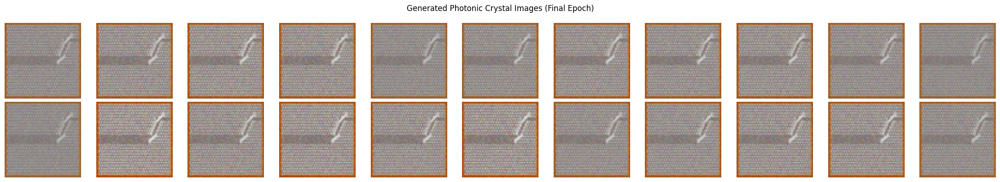

In [9]:
import matplotlib.pyplot as plt

with torch.no_grad():
    sample = gen(fixed_noise).reshape(-1, 3, IMG_SIZE, IMG_SIZE).cpu()
    sample = sample * 0.5 + 0.5  # unnormalize

    fig, axes = plt.subplots(2, 11, figsize=(22, 4))
    for i, ax in enumerate(axes.flatten()):
        ax.imshow(sample[i].permute(1, 2, 0).clamp(0, 1))
        ax.axis("off")
    plt.suptitle("Generated Photonic Crystal Images (Final Epoch)")
    plt.tight_layout()
    plt.show()